In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plot
from sklearn.cluster import KMeans
from random import seed
from random import sample
import time
from scipy.stats import wasserstein_distance
from statistics import stdev
import csv

In [2]:
# Custom functions
def recomb_prob(gd1, gd2):
    return 0.5*(1-np.exp(-2*np.abs(gd2-gd1)))

def get_cluster_based_on_genetic_distance(df, prob=None, a=100):
    chn = df['Chr'].unique()
    chn.sort()

    tcls=[]
    tc=0
    for cr in chn:
        print("Start for chromosome: ", cr)
        dx = pd.DataFrame(df[df['Chr']==cr].reset_index())
        cls=[]
        i=0
        if prob is None:
            p = (a*recomb_prob(dx['Genetic'][0],dx['Genetic'][dx.shape[0]-1]))/dx.shape[0]
        else:
            p = prob[cr-1]
        print("Prob=", p)

        while i<dx.shape[0]:
            k=i

            while True:
                m=[recomb_prob(dx['Genetic'][k],j) for j in dx['Genetic']]
                n=[k+j for j in range(min(1000, dx.shape[0]-k)) if m[k+j]<=p]
                if(len(n)<=1):
                    break;
                k=max(n)

            cls.append(dx['Physical'][i])
            i=k+1

        print("Done for chromosome: ", cr)
        tcls.append(cls)
        tc += len(cls)
        
        print("Total SNPs:"+str(tc))
    return tcls

def getTwoRandomSequences(sd=1):
    # seed random number generator
    seed(sd)
    # prepare a sequence
    sequence = [i for i in range(80)]
    #print(sequence)
    # select a subset without replacement
    subset1 = sample(sequence, 10)
    subset1.sort()
    #print(subset1)

    seqSet = set(sequence)
    seqSet1 = set(subset1)
    seqSet2 = seqSet.difference(seqSet1)

    subset2=sample(list(seqSet2), 15)
    subset2.sort()
    #print(subset2)
    
    return subset1,subset2

def convertToProb(M_x, M_xf, joinP=False):
    r=-1
    k=M_x.shape[0]
    if joinP==True:
        k *= M_x.shape[1]
        
    for col in M_x.columns.values:
        r+=1
        tdf = M_x[col].value_counts().to_dict()
        keys=tdf.keys()
        for i in keys:
            if i==0.0:
                M_xf.at[r,'A']=tdf[i]/k
            elif i==0.5:
                M_xf.at[r,'B']=tdf[i]/k
            elif i==1.0:
                M_xf.at[r,'C']=tdf[i]/k
            elif i==1.5:
                M_xf.at[r,'D']=tdf[i]/k
            elif i==2.0:
                M_xf.at[r,'E']=tdf[i]/k
                
                
def getInterestingSNPs(dfSNPs, repSNPs, genB, genC, chromosome=1, position=1, test=False):
    if chromosome < 1 or chromosome > len(repSNPs) or position<0 or position>len(repSNPs[chromosome-1]):
        return None
    
    rs = repSNPs[chromosome-1][position-1]
    startPos = "chr"+str(chromosome)+"_"+str(rs)
    endPos = "chr"+str(chromosome)+"_"+str(repSNPs[chromosome-1][len(repSNPs[chromosome-1])-1])

    if position<len(repSNPs[chromosome-1]):
        endPos = "chr"+str(chromosome)+"_"+str(repSNPs[chromosome-1][position])

    if test==True:
        print(startPos, endPos)
    si = df_snps.columns.get_loc(startPos)
    ei = df_snps.columns.get_loc(endPos)
    
    if position>=len(repSNPs[chromosome-1]):
        ei += 1
    if test==True:
        print(si, ei)
    
    M_b = dfSNPs.iloc[genB,si:ei]
    M_c = dfSNPs.iloc[genC,si:ei]
    
    M_bf = pd.DataFrame({ 'chrPos': M_b.columns.values, 
                    'A': [0.0 for i in M_b.columns],
                    'B': [0.0 for i in M_b.columns],
                    'C': [0.0 for i in M_b.columns],
                    'D': [0.0 for i in M_b.columns],
                    'E': [0.0 for i in M_b.columns]})
    
    M_cf = pd.DataFrame({ 'chrPos': M_c.columns.values, 
                    'A': [0.0 for i in M_c.columns],
                    'B': [0.0 for i in M_c.columns],
                    'C': [0.0 for i in M_c.columns],
                    'D': [0.0 for i in M_c.columns],
                    'E': [0.0 for i in M_c.columns]})
    
    convertToProb(M_b, M_bf)
    convertToProb(M_c, M_cf)
    
    if test==True:
        print("Matrix for cluster B")
        print(M_bf)
        #print(M_bf.sum(axis=1))
        print("Matrix for cluster C")
        print(M_cf)
        #print(M_bf.sum(axis=1))
    
    M_rank = pd.DataFrame({'chrPos':M_bf.chrPos.values,
                      'EMD':[0.0 for i in M_bf.chrPos.values]})
    r=-1
    for cr in M_bf.chrPos:
        r+=1
        r1=M_bf.loc[M_bf["chrPos"]==cr]
        r2=M_cf.loc[M_cf["chrPos"]==cr]
        l1 = [r1.A.values[0], r1.B.values[0], r1.C.values[0], r1.D.values[0], r1.E.values[0]]
        l2 = [r2.A.values[0], r2.B.values[0], r2.C.values[0], r2.D.values[0], r2.E.values[0]]
        emd=wasserstein_distance(l1,l2)
        M_rank.at[r,'EMD']=emd
    
    M_rank.sort_values(by=['EMD'], ascending=False, inplace=True)
    M_rank.reset_index(drop=True, inplace=True)
    
    if test==True:
        print("Wasserstein distance between B and C")
        print(M_rank)
        print(M_rank.shape)
        
    x = M_rank['chrPos'][0]
    y = M_rank['EMD'][0]
    z = y
    if len(M_rank['EMD']) > 1:
        z = stdev(M_rank['EMD'])
    
    return [x,y,z]

def getAllInterestingSNPs(dfSNPs, repSNPs,s1=None,s2=None):
    if s1==None or s2==None:
        s1,s2=getTwoRandomSequences(int(time.time()))
    
    print(s1,s2)
    chr_index=0
    M_EMD=pd.DataFrame({'chrPos':[],'EMD':[],'SD':[]})
    for posList in repSNPs:
        chr_index+=1
        #print(chr_index)
        pos=0

        for i in posList:
            pos+=1
            #print(pos)
            tchrList = getInterestingSNPs(dfSNPs, repSNPs, s1, s2, chr_index, pos)
            #print(tchrList)
            M_EMD.loc[len(M_EMD)] = tchrList
    return M_EMD

In [3]:
# Read file
df = pd.read_table("g2f_hybrids_synthetic_map.txt")

In [4]:
df.head()

,Marker,Chr,Physical,Genetic
0,chr1_2111,1,2111,0.000019
1,chr1_6984,1,6984,0.000064
2,chr1_7035,1,7035,0.000065
3,chr1_7080,1,7080,0.000065
4,chr1_9405,1,9405,0.000087


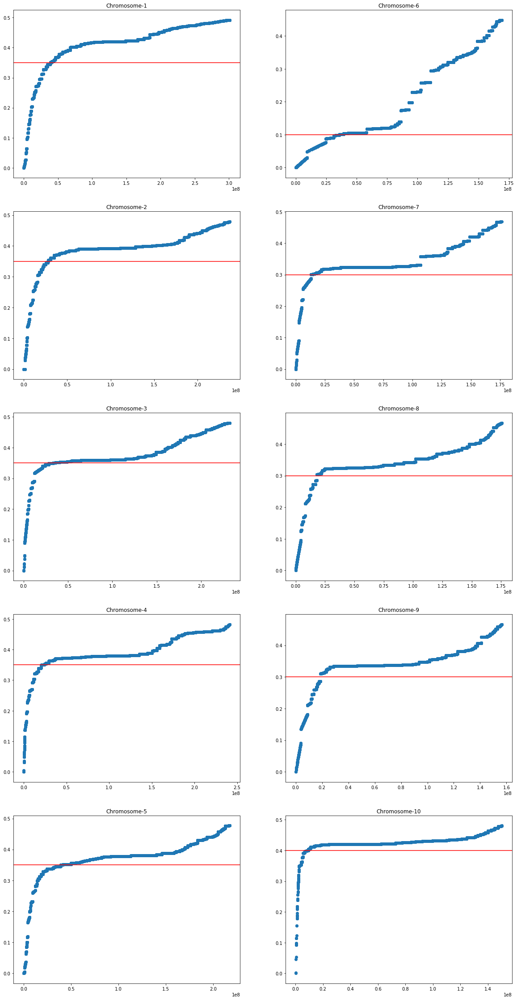

In [5]:
fig, axs = plot.subplots(5, 2)
fig.set_size_inches(20, 40)
for i in range(5):
    for j in range(2):
        ch=(5*j+i+1)
        X_1 = pd.DataFrame(df[df['Chr']==ch].reset_index())
        axs[i, j].scatter(X_1['Physical'],[recomb_prob(X_1['Genetic'][0], j) for j in X_1['Genetic']])
        
        if ch in range(1,6):
            axs[i, j].axhline(y=.35, color='r', linestyle='-')
        elif ch in range(7,10):
            axs[i, j].axhline(y=.3, color='r', linestyle='-')
        elif ch==6:
            axs[i, j].axhline(y=.1, color='r', linestyle='-')
        elif ch==10:
            axs[i, j].axhline(y=.4, color='r', linestyle='-')
        
        axs[i, j].set_title('Chromosome-'+str(ch))

In [27]:
#repSNPs = get_cluster_based_on_genetic_distance(df)
#cls2 = get_cluster_based_on_genetic_distance(df, [.35,.35,.35,.35,.35,.1,.3,.3,.3,.4])
tds = pd.read_csv('repSNPs.csv', header=None, delimiter=',')
repSNPs = [[int(i) for i in d if str(i)!='nan'] for d in tds.values]
del(tds)

In [28]:
print([len(i) for i in repSNPs])

[127, 85, 87, 90, 86, 47, 49, 68, 60, 72]


In [29]:
df_snps = pd.DataFrame(pd.read_csv('../Stephen/g2f_hybrids_synthetic.csv', sep='\t', index_col=0).T)
df_snps.head()

taxa,chr1_2111,chr1_6984,chr1_7035,chr1_7080,chr1_9405,chr1_10097,chr1_109083,chr1_109116,chr1_109133,chr1_109136,...,chr10_149808541,chr10_149811649,chr10_149811754,chr10_149835306,chr10_149921669,chr10_149921672,chr10_149928095,chr10_149928138,chr10_149928160,chr10_150087943
X2369.3IIH6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X2369.PHN82,0.5,0.5,0.5,0.5,0.5,0.0,0.5,0.5,0.5,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B14A.MO17,0.5,0.5,0.5,0.5,0.5,0.0,0.5,0.5,0.5,0.5,...,1.0,0.0,0.5,1.0,0.0,0.0,0.0,0.0,0.0,0.0
B37.H95,0.0,0.5,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B73.MO17,0.5,0.5,0.5,1.5,0.5,0.0,0.5,0.5,0.5,0.5,...,1.0,0.0,0.5,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [92]:
gl=[df_snps.iloc[k].name for k in range(df_snps.shape[0])]
print(len(gl))
print(gl)

99
['X2369.3IIH6', 'X2369.PHN82', 'B14A.MO17', 'B37.H95', 'B73.MO17', 'B73.PHM49', 'B73.PHN82', 'B73.PHZ51', 'GEMN_0268.3IIH6', 'ICI441.LH123HT', 'ICI441.LH185', 'ICI441.LH38', 'ICI441.LH51', 'ICI441.LH82', 'ICI441.PHG29', 'ICI441.PHG47', 'ICI441.PHG83', 'ICI441.PHK56', 'ICI441.PHN82', 'ICI441.PHR55', 'ICI441.PHW30', 'ICI441.PHZ51', 'ICI441.Q381', 'LH195.LH123HT', 'LH195.LH185', 'LH195.LH38', 'LH195.LH51', 'LH195.LH82', 'LH195.PHG29', 'LH195.PHG47', 'LH195.PHG83', 'LH195.PHK56', 'LH195.PHN82', 'LH195.PHR55', 'LH195.PHW30', 'LH195.PHZ51', 'LH195.Q381', 'LH198.LH123HT', 'LH198.LH185', 'LH198.LH38', 'LH198.LH51', 'LH198.LH82', 'LH198.PHG29', 'LH198.PHG47', 'LH198.PHG83', 'LH198.PHK56', 'LH198.PHN37', 'LH198.PHN82', 'LH198.PHR55', 'LH198.PHW30', 'LH198.Q381', 'LH74.PHN82', 'PB80.PHZ51', 'PHB47.LH123HT', 'PHB47.LH185', 'PHB47.LH38', 'PHB47.LH51', 'PHB47.LH82', 'PHB47.PHG29', 'PHB47.PHG47', 'PHB47.PHG83', 'PHB47.PHK56', 'PHB47.PHN82', 'PHB47.PHR55', 'PHB47.PHW30', 'PHB47.Q381', 'PHG29.PHG47'

In [37]:
genDS = pd.DataFrame(pd.read_csv('Dry_adjusted_Growth_pick_34_35_36.csv'))
genDS.head(10)

,rID,DAP,Genotype,genCode,GDD,cGDD,ClusteID
0,116,51,GEMN-0260 x 3IIH6,G_9,22.864286,985.364286,36
1,117,52,GEMN-0260 x 3IIH6,G_9,22.642857,1008.007143,36
2,118,53,GEMN-0260 x 3IIH6,G_9,22.478571,1030.485714,36
3,119,54,GEMN-0260 x 3IIH6,G_9,23.107143,1053.592857,36
4,120,55,GEMN-0260 x 3IIH6,G_9,23.957143,1077.550000,36
5,121,56,GEMN-0260 x 3IIH6,G_9,24.307143,1101.857143,36
6,232,51,ICI 441 x LH82,G_15,22.864286,985.364286,34
7,233,52,ICI 441 x LH82,G_15,22.642857,1008.007143,34
8,234,53,ICI 441 x LH82,G_15,22.478571,1030.485714,34
9,235,54,ICI 441 x LH82,G_15,23.107143,1053.592857,34


In [67]:
cgl = pd.DataFrame(genDS.groupby(['ClusteID']).agg({'Genotype': lambda x: x.unique().tolist()}))
print(cgl.iloc[0].name, cgl.iloc[0].values)
print(cgl.iloc[1].name, cgl.iloc[1].values)
print(cgl.iloc[2].name, cgl.iloc[2].values)

34 [list(['ICI 441 x LH82', 'LH198 x PHG83', 'PHB47 x PHG29'])]
35 [list(['LH195 x PHG47', 'LH195 x PHR55', 'LH198 x LH123HT', 'LH198 x PHK56', 'PHB47 x LH38', 'PHN66 x LH82'])]
36 [list(['GEMN-0260 x 3IIH6', 'PHB47 x PHN82', 'PHB47 x Q381', 'PHW52 x PHR55'])]


In [90]:
# id 34,35,36
g34 = [s.replace(' x ', '.').replace(' ', '').replace('-','_') for s in cgl.loc[34][0]]
g35 = [s.replace(' x ', '.').replace(' ', '').replace('-','_') for s in cgl.loc[35][0]]
g36 = [s.replace(' x ', '.').replace(' ', '').replace('-','_') for s in cgl.loc[36][0]]

print(g34,g35,g36)
GEMN_0268.3IIH6

['ICI441.LH82', 'LH198.PHG83', 'PHB47.PHG29'] ['LH195.PHG47', 'LH195.PHR55', 'LH198.LH123HT', 'LH198.PHK56', 'PHB47.LH38', 'PHN66.LH82'] ['GEMN_0260.3IIH6', 'PHB47.PHN82', 'PHB47.Q381', 'PHW52.PHR55']


In [93]:
s34=[gl.index(k) for k in g34]
s35=[gl.index(k) for k in g35]
s36=[gl.index(k) for k in ['PHB47.PHN82', 'PHB47.Q381', 'PHW52.PHR55']]
print(s34,s35,s36)

[13, 44, 58] [29, 33, 37, 45, 55, 71] [62, 65, 94]


In [94]:
M_34_35 = getAllInterestingSNPs(df_snps, repSNPs, s34, s35)
M_34_35.sort_values(by=['EMD','SD'], ascending=[False,True], inplace=True).reset_index()

M_34_36 = getAllInterestingSNPs(df_snps, repSNPs, s34, s36)
M_34_36.sort_values(by=['EMD','SD'], ascending=[False,True], inplace=True).reset_index()

M_35_36 = getAllInterestingSNPs(df_snps, repSNPs, s35, s36)
M_35_36.sort_values(by=['EMD','SD'], ascending=[False,True], inplace=True).reset_index()

[13, 44, 58] [29, 33, 37, 45, 55, 71]
[13, 44, 58] [62, 65, 94]
[29, 33, 37, 45, 55, 71] [62, 65, 94]


In [96]:
M_34_35.to_csv("output/M_34_35.csv")
M_34_36.to_csv("output/M_34_36.csv")
M_35_36.to_csv("output/M_35_36.csv")  

In [99]:
M_34_35=pd.DataFrame(pd.read_csv("output/M_34_35.csv"))
M_34_36=pd.DataFrame(pd.read_csv("output/M_34_36.csv"))
M_35_36=pd.DataFrame(pd.read_csv("output/M_35_36.csv"))

In [139]:
M_BC=pd.DataFrame(M_34_35.loc[M_34_35['EMD']>=0.26666]['chrPos'],columns=['chrPos'])
M_BD=pd.DataFrame(M_34_36.loc[M_34_36['EMD']>=0.26666]['chrPos'],columns=['chrPos'])
M_CD=pd.DataFrame(M_35_36.loc[M_35_36['EMD']>=0.26666]['chrPos'],columns=['chrPos'])

M_BC.sort_values(by=['chrPos'], ascending=[True], inplace=True)
M_BD.sort_values(by=['chrPos'], ascending=[True], inplace=True)
M_CD.sort_values(by=['chrPos'], ascending=[True], inplace=True)

In [143]:
list(M_CD['chrPos'])

['chr10_10290450',
 'chr10_117953462',
 'chr10_119959122',
 'chr10_127258890',
 'chr10_141835317',
 'chr10_144956394',
 'chr10_146120344',
 'chr10_147141042',
 'chr10_147845767',
 'chr10_1716185',
 'chr10_2228460',
 'chr10_3129151',
 'chr10_4663939',
 'chr10_4685893',
 'chr10_56147474',
 'chr10_84236286',
 'chr10_9594490',
 'chr10_98686686',
 'chr1_107454949',
 'chr1_11945230',
 'chr1_119939384',
 'chr1_150451510',
 'chr1_161036612',
 'chr1_16825232',
 'chr1_172875608',
 'chr1_178008720',
 'chr1_191600795',
 'chr1_202528664',
 'chr1_203647994',
 'chr1_206431560',
 'chr1_209640180',
 'chr1_226273978',
 'chr1_229207386',
 'chr1_235455354',
 'chr1_239207776',
 'chr1_23924747',
 'chr1_246354591',
 'chr1_250440790',
 'chr1_253135369',
 'chr1_258447928',
 'chr1_262545760',
 'chr1_266326376',
 'chr1_2754239',
 'chr1_277145358',
 'chr1_280344385',
 'chr1_281908384',
 'chr1_283720344',
 'chr1_288759823',
 'chr1_290225569',
 'chr1_295589320',
 'chr1_3022845',
 'chr1_31207566',
 'chr1_33216301',


In [125]:
print("34-35",M_34_35.loc[M_34_35['EMD']>=0.26666]['chrPos'])
print("34-36",M_34_36.loc[M_34_36['EMD']>=0.26666]['chrPos'])
print("35-36",M_35_36.loc[M_35_36['EMD']>=0.26666]['chrPos'])

34-35 0      chr6_152645824
1      chr5_205791371
2       chr1_54188621
3       chr3_99225881
4       chr3_19926108
5      chr1_281168774
6      chr3_201230832
7      chr2_232366080
8      chr7_170251419
9       chr6_42935916
10     chr1_235448979
11     chr9_135834791
12      chr7_21150256
13     chr4_239372746
14      chr1_66290661
15     chr4_185690835
16      chr9_92737635
17     chr3_206952500
18      chr2_54757262
19     chr2_213162634
20     chr2_194361476
21      chr9_50800404
22     chr6_137891662
23      chr7_48704825
24      chr9_94038449
25      chr2_41958405
26     chr5_175688972
27      chr2_22999246
28     chr4_231034089
29      chr2_39295440
           ...       
41     chr4_163306832
42     chr3_173802171
43      chr6_92168037
44     chr9_147612170
45     chr8_155362233
46      chr9_17057602
47    chr10_148762907
48     chr1_246687599
49     chr7_121815040
50      chr7_20171965
51     chr6_117453261
52     chr1_253135369
53     chr2_164881985
54     chr1_161306646
55  

In [261]:
s1,s2=getTwoRandomSequences(int(time.time()))
chrList = getInterestingSNPs(df_snps, repSNPs, s1, s2, 9, 59)
chrList

['chr9_156239983', 'chr9_156239990', 'chr9_156240009']

In [231]:
#pd.show_versions()
t=10
l=M_rank['EMD'][0]*t
while l<=1:
    t*=10
    l=M_rank['EMD'][0]*t
lmt = int(l)/t
print(lmt,t)
list(M_rank.chrPos[M_rank['EMD']>=lmt])

0.09 100


['chr1_1860363',
 'chr1_1860005',
 'chr1_1859993',
 'chr1_1860006',
 'chr1_1860124',
 'chr1_1763337',
 'chr1_1763421']

In [12]:
s1,s2=getTwoRandomSequences(int(time.time()))
print(s1)
print(s2)
getInterestingSNPs(df_snps, repSNPs, s1, s2, 1, 3)

[6, 10, 13, 28, 29, 36, 37, 54, 55, 75]
[4, 11, 12, 16, 18, 21, 22, 24, 30, 39, 46, 52, 62, 64, 67]
Matrix for cluster B
          chrPos    A    B    C    D    E
0   chr1_1466736  0.8  0.0  0.2  0.0  0.0
1   chr1_1467043  1.0  0.0  0.0  0.0  0.0
2   chr1_1568364  1.0  0.0  0.0  0.0  0.0
3   chr1_1665404  1.0  0.0  0.0  0.0  0.0
4   chr1_1665405  1.0  0.0  0.0  0.0  0.0
5   chr1_1665408  1.0  0.0  0.0  0.0  0.0
6   chr1_1665430  1.0  0.0  0.0  0.0  0.0
7   chr1_1695259  0.9  0.1  0.0  0.0  0.0
8   chr1_1695298  0.9  0.1  0.0  0.0  0.0
9   chr1_1763157  1.0  0.0  0.0  0.0  0.0
10  chr1_1763292  0.7  0.0  0.3  0.0  0.0
11  chr1_1763337  0.6  0.0  0.4  0.0  0.0
12  chr1_1763359  0.7  0.0  0.3  0.0  0.0
13  chr1_1763397  1.0  0.0  0.0  0.0  0.0
14  chr1_1763421  0.6  0.0  0.4  0.0  0.0
15  chr1_1780150  1.0  0.0  0.0  0.0  0.0
16  chr1_1780188  1.0  0.0  0.0  0.0  0.0
17  chr1_1791996  1.0  0.0  0.0  0.0  0.0
18  chr1_1792001  1.0  0.0  0.0  0.0  0.0
19  chr1_1792012  1.0  0.0  0.0  0.0  0

['chr1_1792012', 0.10666666666666669, 0.037274679199179026]